## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images. (DONE)
* Apply a distortion correction to raw images. (DONE)
* Use color transforms, gradients, etc., to create a thresholded binary image. (DONE)
* Apply a perspective transform to rectify binary image ("birds-eye view"). (DONE)
* Detect lane pixels and fit to find the lane boundary. (NEEDS SOME TWEAKS)
* Determine the curvature of the lane and vehicle position with respect to center. (NEEDS SOME TWEAKS)
* Warp the detected lane boundaries back onto the original image. (DONE)
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position. (IN PROGRESS)

---

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

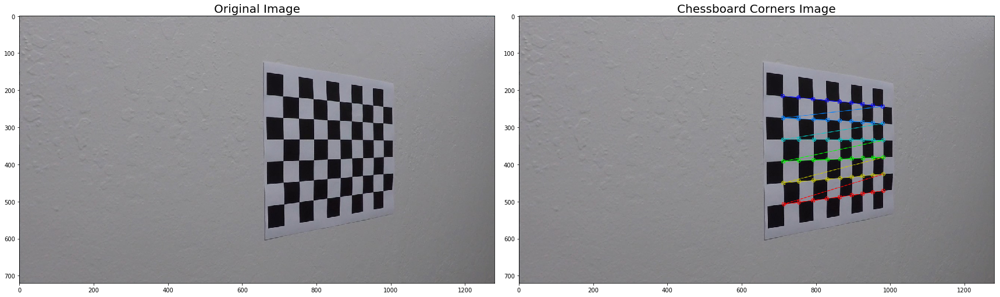

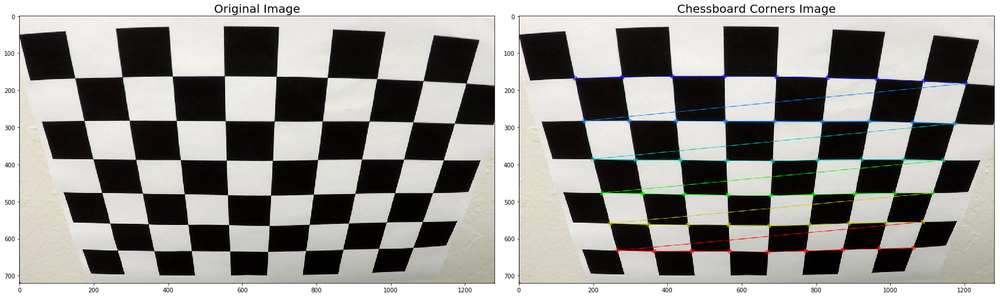

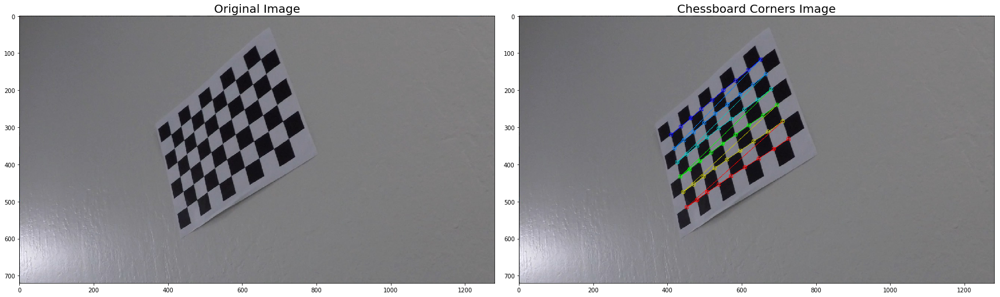

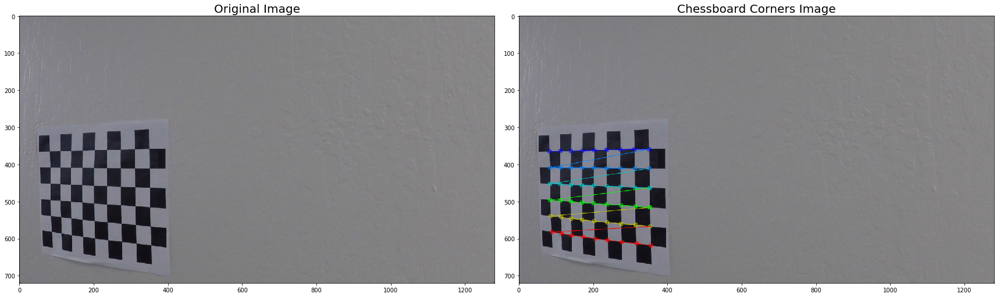

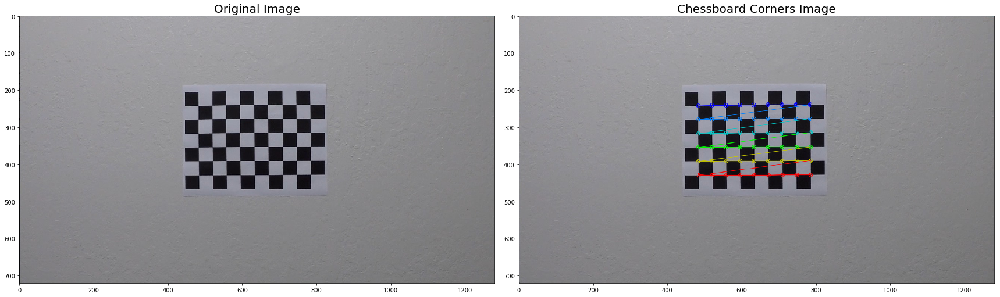

...

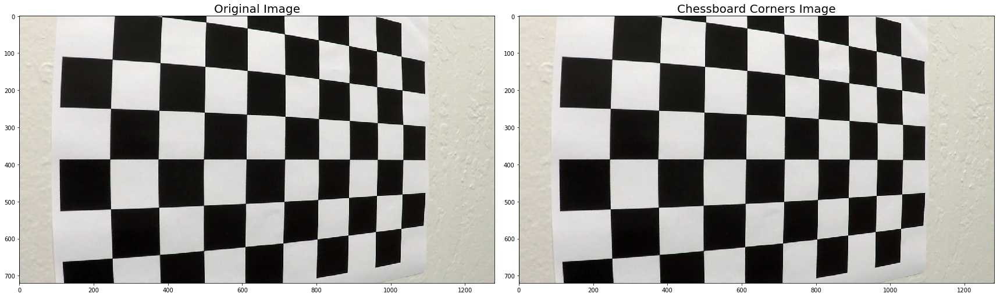

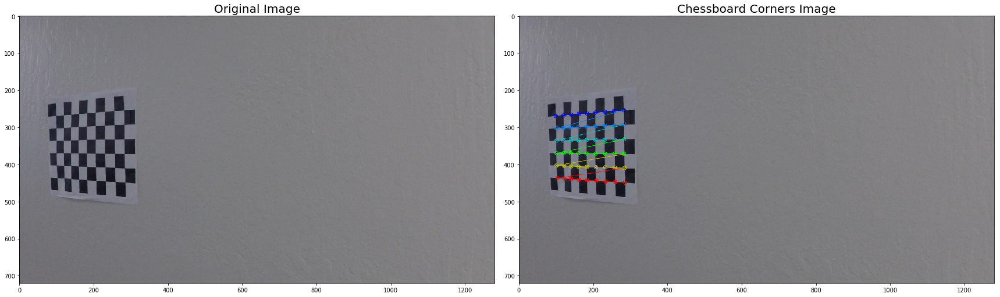

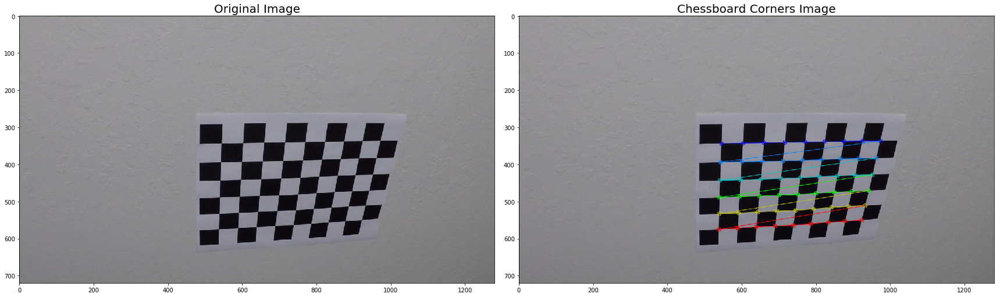

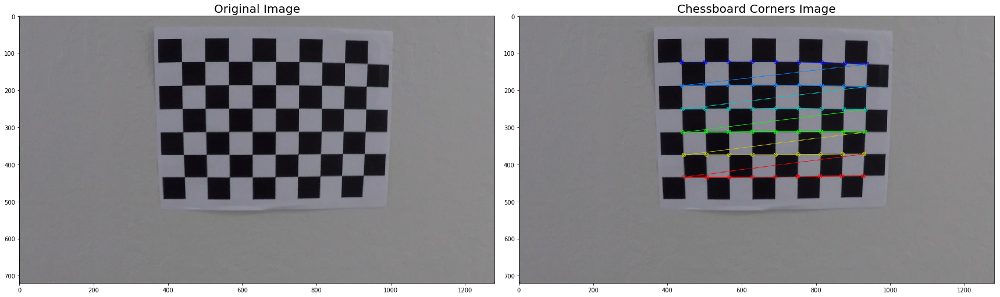

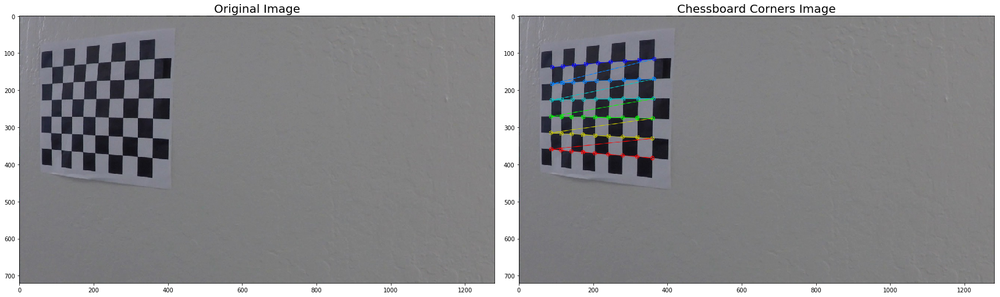

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = mpimg.imread(fname)
    #img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #plt.imshow(img)
        #cv2.waitKey(500)
        #cv2.destroyAllWindows()
        #f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
        #f.tight_layout()
        #ax1.imshow(mpimg.imread(fname))
        #ax1.set_title('Original Image', fontsize=20)
        #ax2.imshow(img)
        #ax2.set_title('Chessboard Corners Image', fontsize=20)
        #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(mpimg.imread(fname))
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(img)
    ax2.set_title('Chessboard Corners Image', fontsize=20)
    #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#test_image1 = mpimg.imread('../camera_cal/calibration1.jpg')


## Apply a distortion correction to raw images

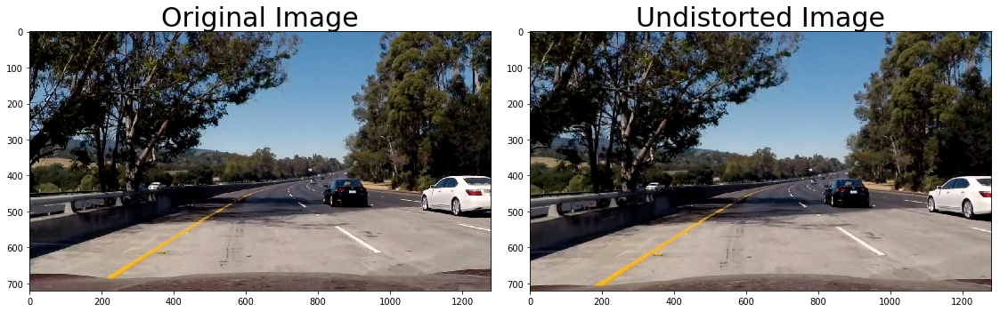

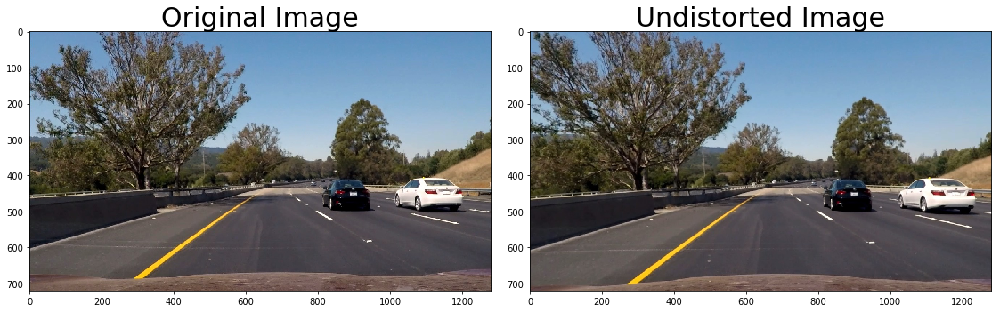

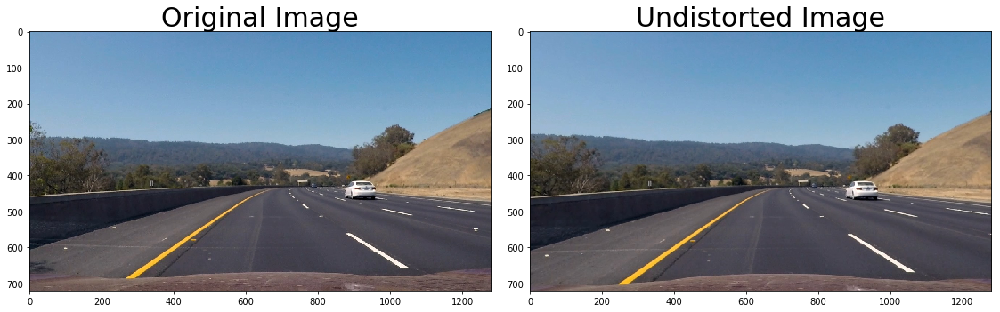

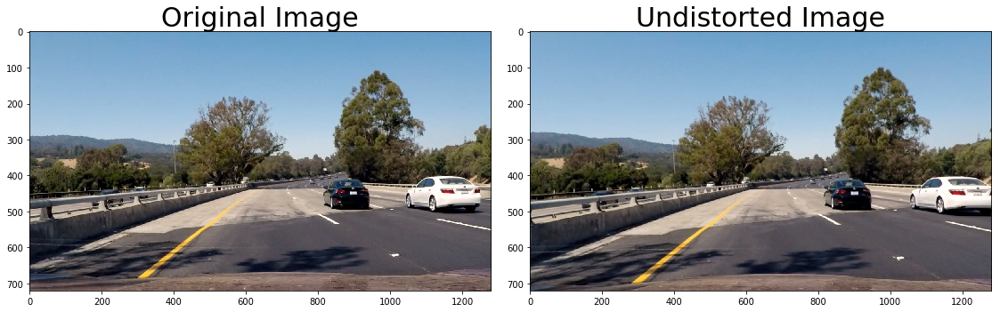

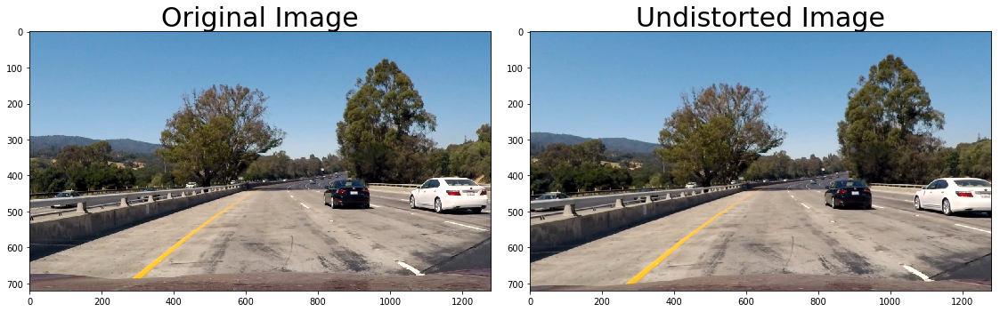

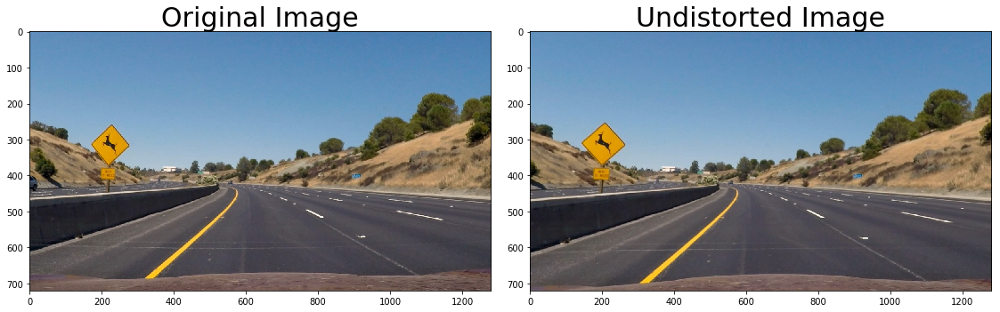

In [2]:
def cal_undistort(img):
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

raw_images = glob.glob('../test_images/test*.jpg')
for fname in raw_images:
    img = mpimg.imread(fname)
    undist = cal_undistort(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))
    f.tight_layout()
    ax1.imshow(mpimg.imread(fname))
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Use Color and Gradient Thresholds to create threshold binary images

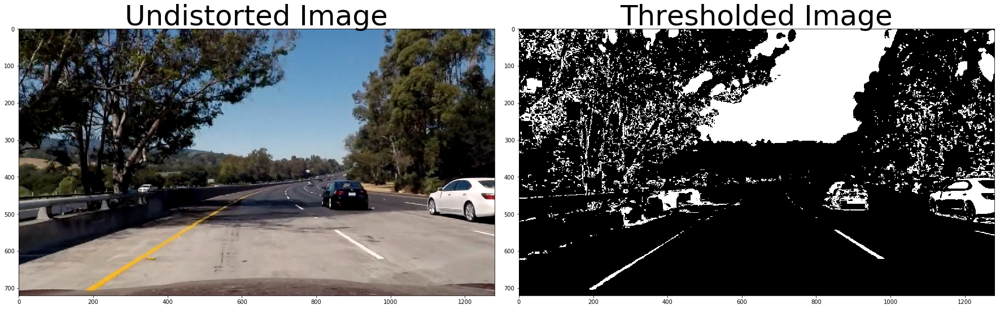

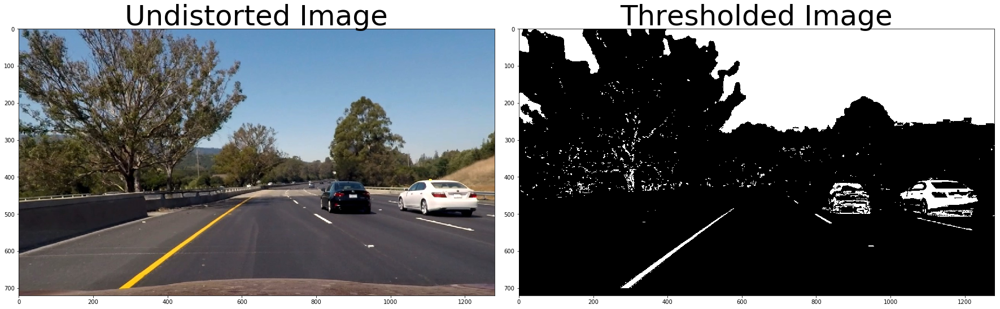

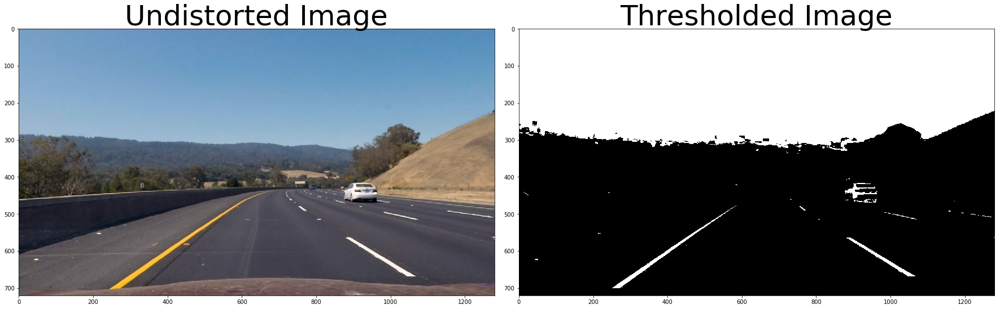

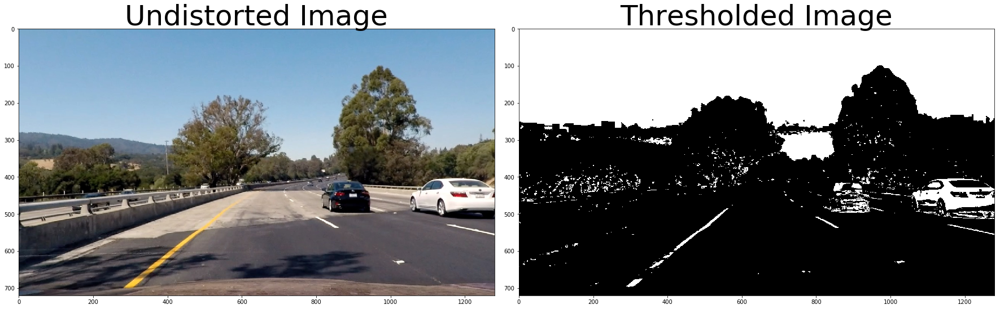

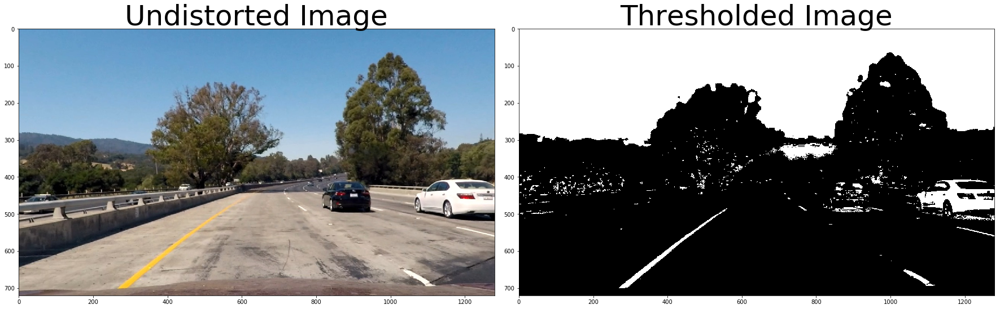

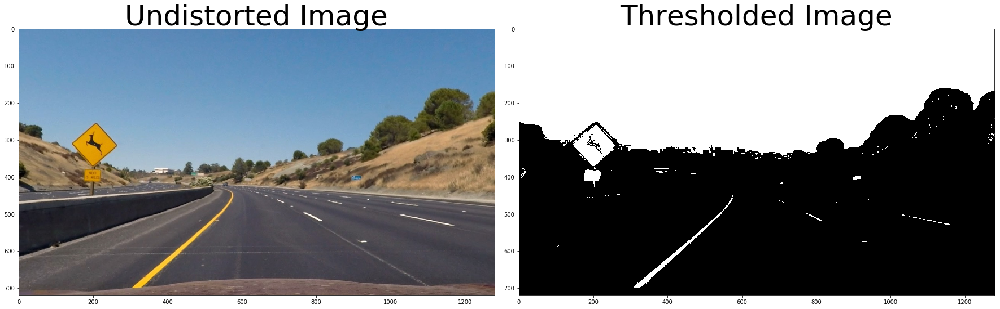

In [235]:
def threshold(img, s_thresh=(200, 255), sx_thresh=(100, 150), b_thresh=(145,200), l_thresh=(215,255)):
    #img = np.copy(img)
    img = cal_undistort(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    #l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    b_channel = lab[:,:,2]
    
    luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    l_channel = luv[:,:,0]
    
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold hls color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Threshold lab color channel
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh[0]) & (b_channel <= b_thresh[1])] = 1
    
    # Threshold luv color channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1) | (b_binary == 1) | (l_binary == 1)] = 1
    return combined_binary



threshold_images = glob.glob('../test_images/test*.jpg')
for fname in threshold_images:
    image = mpimg.imread(fname)
    img = cal_undistort(image)
    #hls_binary = hls_select(image, thresh=(0, 150))
    thresholded_image = threshold(image)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Undistorted Image', fontsize=50)
    ax2.imshow(thresholded_image, cmap='gray')
    ax2.set_title('Thresholded Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

## Apply Perspective Transform (warp) to rectify binary images

'\nunwarped_images = glob.glob(\'../test_images/test*.jpg\')\nfor fname in unwarped_images:\n    img = mpimg.imread(fname)\n    warped_im = perspective_transform(img)\n    f, (ax1, ax2) = plt.subplots(1,2,figsize=(20,10))\n    ax1.set_title("Undistorted image")\n    ax1.imshow(cal_undistort(img))\n    ax2.set_title("Warped image")\n    ax2.imshow(warped_im, cmap=\'gray\')\n    '

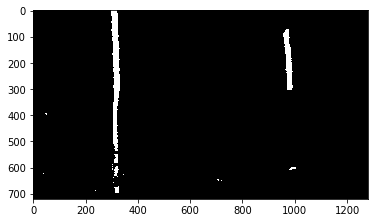

In [237]:
def perspective_transform(img):
    # Define calibration box in source (original) and destination (desired or warped) coordinates
    img = threshold(img)
    img_size = (img.shape[1],img.shape[0])
    
    # Four source coordinates
    src = np.float32(
        [[100,720],
         [1200,720],
         [800,500],
         [500,500]])
    
    # Four desired coordinates
    dst = np.float32(
        [[200,720],
         [1000,720],
         [1000,0],
         [200,0]])    
    
    # Compute the perspective transform, M (the transformation matrix)
    M = cv2.getPerspectiveTransform(src,dst)
    
    # Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped

detect_image4 = mpimg.imread('../test_images/test4.jpg')
out_img4 = perspective_transform(detect_image4)
plt.imshow(out_img4,  cmap='gray')
'''
unwarped_images = glob.glob('../test_images/test*.jpg')
for fname in unwarped_images:
    img = mpimg.imread(fname)
    warped_im = perspective_transform(img)
    f, (ax1, ax2) = plt.subplots(1,2,figsize=(20,10))
    ax1.set_title("Undistorted image")
    ax1.imshow(cal_undistort(img))
    ax2.set_title("Warped image")
    ax2.imshow(warped_im, cmap='gray')
    '''

## Detect lane pixels and fit to find the lane boundary

'\n# I have no idea how I got these kinds of weird results, it seems to be mixed up or something, pls help\ndetect_images = glob.glob(\'../test_images/test*.jpg\') \nfor fname in detect_images:\n    img = mpimg.imread(fname)\n    fit_image, place_holder1, place_holder2 = fit_polynomial(img)\n    f, (ax1, ax2) = plt.subplots(1,2,figsize=(20,10))\n    ax1.set_title("Source image")\n    ax1.imshow(cal_undistort(img))\n    ax2.set_title("Fit image")\n    ax2.imshow(fit_image)\n'

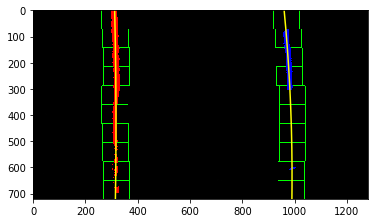

In [253]:
'''
def detect_lane_pixels(image):
    binary_warped = perspective_transform(image)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #plt.plot(histogram)

    
    
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        #Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin  
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin 
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
        #Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox <= win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox <= win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        #If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img
    
    
    
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = detect_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    #try:
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    #except TypeError:
    #    # Avoids an error if `left` and `right_fit` are still none or incorrect
    #    print('The function failed to fit a line!')
    #    left_fitx = 1*ploty**2 + 1*ploty
    #    right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit
'''

def find_lane_pixels(binary_warped):
    binary_warped = perspective_transform(binary_warped)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 100

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    plt.imshow(out_img)
    
    # Plots the left and right polynomials on the lane lines
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, binary_warped.shape[1])
    plt.ylim(binary_warped.shape[0],0)
    

    return out_img, left_fitx, right_fitx, ploty


detect_image1 = mpimg.imread('../test_images/test4.jpg')
out_img = fit_polynomial(detect_image1)


    
#test_img = mpimg.imread('../test_images/test1.jpg')
#fit_polynomial(test_img)

'''
# I have no idea how I got these kinds of weird results, it seems to be mixed up or something, pls help
detect_images = glob.glob('../test_images/test*.jpg') 
for fname in detect_images:
    img = mpimg.imread(fname)
    fit_image, place_holder1, place_holder2 = fit_polynomial(img)
    f, (ax1, ax2) = plt.subplots(1,2,figsize=(20,10))
    ax1.set_title("Source image")
    ax1.imshow(cal_undistort(img))
    ax2.set_title("Fit image")
    ax2.imshow(fit_image)
'''

## Search around poly

'\nsearch_images = glob.glob(\'../test_images/test*.jpg\') \nfor fname in search_images:\n    img = mpimg.imread(fname)\n    out_image = search_around_poly(img)\n    f, (ax1, ax2) = plt.subplots(1,2,figsize=(20,10))\n    ax1.set_title("Source image")\n    ax1.imshow(mpimg.imread(fname))\n    ax2.set_title("Out image")\n    ax2.imshow(out_image)\n'

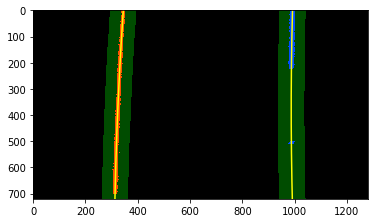

In [256]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    # Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    # Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty


def search_around_poly(img):
    binary_warped = perspective_transform(img)
    leftx, lefty, rightx, righty, place_holder = find_lane_pixels(img)
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    # Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 50

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    #left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    '''
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    '''
    ## End visualization steps ##
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, binary_warped.shape[1])
    plt.ylim(binary_warped.shape[0],0)
    
    return result

test_image2 = mpimg.imread('../test_images/test6.jpg')
search_around_poly(test_image2)



'''
search_images = glob.glob('../test_images/test*.jpg') 
for fname in search_images:
    img = mpimg.imread(fname)
    out_image = search_around_poly(img)
    f, (ax1, ax2) = plt.subplots(1,2,figsize=(20,10))
    ax1.set_title("Source image")
    ax1.imshow(mpimg.imread(fname))
    ax2.set_title("Out image")
    ax2.imshow(out_image)
'''

## Project lines onto original images

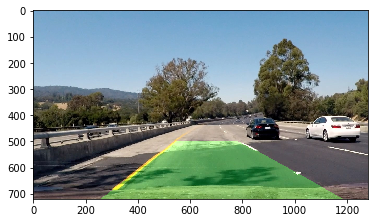

In [270]:
test_image = mpimg.imread('../test_images/test4.jpg')
warped = perspective_transform(test_image)
# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))*255

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

src = np.float32(
    [[100,720],
     [1200,720],
     [800,500],
     [500,500]])
    
# Four desired coordinates
dst = np.float32(
    [[200,720],
     [1000,720],
     [1000,0],
     [200,0]])    

Minv = cv2.getPerspectiveTransform(dst,src)

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(test_image, 1, newwarp, 0.3, 0)
plt.imshow(result)

## Measure the real curvatuve

In [296]:
def measure_curvature_real(img):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    leftx, lefty, rightx, righty, place_holder = find_lane_pixels(img)
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_fitx = left_fit_cr[0]*y_eval**2 + left_fit_cr[1]*y_eval + left_fit_cr[2]
    right_fitx = right_fit_cr[0]*y_eval**2 + right_fit_cr[1]*y_eval + right_fit_cr[2]
    
    # Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    center = (right_fitx - left_fitx)/2
    center_offset = abs(img.shape[0]/2 - center) * xm_per_pix
    
    #print("Left curve radius is: ", left_curverad, "m")
    #print("Right curve radius is: ", right_curverad, "m")
    #print("Distance to lane center is: ", center_offset, "m")
    
    return None
 

test_image10 = mpimg.imread('../test_images/test5.jpg')
measure_curvature_real(test_image10)

## Final Pipeline

In [299]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(img):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('../camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for fname in images:
        img = mpimg.imread(fname)
        #img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
    
    warped = perspective_transform(image)
    out_img, left_fitx, right_fitx, ploty = fit_polynomial(warped)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))*255
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    src = np.float32(
        [[100,720],
         [1200,720],
         [800,500],
         [500,500]])
    
    # Four desired coordinates
    dst = np.float32(
        [[200,720],
         [1000,720],
         [1000,0],
         [200,0]])    

    Minv = cv2.getPerspectiveTransform(dst,src)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    #plt.imshow(result)
    
    measure_curvature_real(image)
    
    return result
            
    

## Output testing

In [300]:
white_output = 'project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

error: /tmp/build/80754af9/opencv_1512491964794/work/modules/imgproc/src/color.cpp:11115: error: (-215) (scn == 3 || scn == 4) && (depth == 0 || depth == 5) in function cvtColor


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))